# Gutenberg Book Cover Sorting

Playing with K-means and UMAP image sorting using the [Gutenberg](https://www.gutenberg.org/) database.<br>This project dances up to the question: what *can* we judge based on a book's cover?

Anna Garbier, 2019-11-1, *Designing with ML* Midterm

## 1. Data prep

In [1]:
from datetime import datetime as dt
from requests_html import HTMLSession
from time import sleep
import pandas as pd
import random as rand
import re

In [2]:
# Dataframe setup

gutenberg_df = pd.DataFrame(columns=[
    'uid',
    'original_publication_year',
    'ebook_release_year',
    'language',
    'n_downloads_30d',
    'subject',
    'cover_src'
])

In [3]:
# Scrape info

session = HTMLSession()

responses = 0
errors = []

# Parse html, and update the dataframe accordingly.
# Valid book ranges are by UID, from 10,000 to 60,564.
# Only books with cover art are added to the
# dataframe. Sampling every 10th UID results in
# ~1500 full entries.

for i in range(10000,60564):
    if (i % 10 == 0):
        if (i % 1000 == 0):
            print("Processing ", i, "...")
        try:
            response = session.get('https://www.gutenberg.org/ebooks/' + str(i))

            # Book id
            uid = i

            # Publication year
            for a in response.html.find("a"):
                if ("itemprop='creator'" in str(a)):
                    m = re.search('([0-9]{4})(-[0-9]{4})?$', a.text)
                    original_publication_year = m.group(1)

            # Release year
            for td in response.html.find("td"):
                if ("itemprop='datePublished'" in str(td)):
                    ebook_release_year = dt.strptime(td.text, '%b %d, %Y').year

            # Language
            for tr in response.html.find("tr"):
                if ("itemprop='inLanguage'" in str(tr)):
                    language = tr.attrs.get("content")

            # N downloads
            for td in response.html.find("td"):
                if ("itemprop='interactionCount'" in str(td)):
                    m = re.search('^\d*', td.text)
                    n_downloads_30d = int(m.group(0))

            # Subject
            subjects = []
            for td in response.html.find("td"):
                if ("property='dcterms:subject'" in str(td)):
                    subjects.append(td)
            if subjects[0].text:
                subject = subjects[0].text
            else:
                subject = ''

            # Cover art
            cover_element = response.html.find("img.cover-art")
            cover_src = cover_element[0].attrs.get("src")

            # Update dataframe
            gutenberg_df = gutenberg_df.append({'uid': uid,
                'original_publication_year': original_publication_year,
                'ebook_release_year': ebook_release_year,
                'language': language,
                'n_downloads_30d': n_downloads_30d,
                'subject': subject,
                'cover_src': cover_src}, ignore_index=True)

            responses += 1

            # Rand sleep before next session.get
            time_delay = rand.randrange(0, 1)
            sleep(time_delay)

        except Exception as e:
            errors.append(e)

print("----")
print("Data entries: ", responses)
print("Errors: ", len(errors))
print("----")

Processing  10000 ...
Processing  11000 ...
Processing  12000 ...
Processing  13000 ...
Processing  14000 ...
Processing  15000 ...
Processing  16000 ...
Processing  17000 ...
Processing  18000 ...
Processing  19000 ...
Processing  20000 ...
Processing  21000 ...
Processing  22000 ...
Processing  23000 ...
Processing  24000 ...
Processing  25000 ...
Processing  26000 ...
Processing  27000 ...
Processing  28000 ...
Processing  29000 ...
Processing  30000 ...
Processing  31000 ...
Processing  32000 ...
Processing  33000 ...
Processing  34000 ...
Processing  35000 ...
Processing  36000 ...
Processing  37000 ...
Processing  38000 ...
Processing  39000 ...
Processing  40000 ...
Processing  41000 ...
Processing  42000 ...
Processing  43000 ...
Processing  44000 ...
Processing  45000 ...
Processing  46000 ...
Processing  47000 ...
Processing  48000 ...
Processing  49000 ...
Processing  50000 ...
Processing  51000 ...
Processing  52000 ...
Processing  53000 ...
Processing  54000 ...
Processing

In [12]:
# Download images

import urllib.request

for index, row in gutenberg_df.iterrows():
    # Full image url
    url = row['cover_src']
    
    # File name only
    file_name = url.split('/')[-1]
    
    # Print progress
    if (index % 100 == 0):
        print("downloading " + url + " as " + file_name)
    
    # Download
    try:
        urllib.request.urlretrieve(url, 'end2end_images/' + file_name)
    except Exception as e:
        print(index, e)

downloading https://www.gutenberg.org/cache/epub/10570/pg10570.cover.medium.jpg as pg10570.cover.medium.jpg
downloading https://www.gutenberg.org/cache/epub/26160/pg26160.cover.medium.jpg as pg26160.cover.medium.jpg
downloading https://www.gutenberg.org/cache/epub/33490/pg33490.cover.medium.jpg as pg33490.cover.medium.jpg
downloading https://www.gutenberg.org/cache/epub/38780/pg38780.cover.medium.jpg as pg38780.cover.medium.jpg
downloading https://www.gutenberg.org/cache/epub/41250/pg41250.cover.medium.jpg as pg41250.cover.medium.jpg
downloading https://www.gutenberg.org/cache/epub/43310/pg43310.cover.medium.jpg as pg43310.cover.medium.jpg
downloading https://www.gutenberg.org/cache/epub/45050/pg45050.cover.medium.jpg as pg45050.cover.medium.jpg
downloading https://www.gutenberg.org/cache/epub/47060/pg47060.cover.medium.jpg as pg47060.cover.medium.jpg
downloading https://www.gutenberg.org/cache/epub/48780/pg48780.cover.medium.jpg as pg48780.cover.medium.jpg
downloading https://www.gute

In [5]:
# Shuffle image pointers, and store them in a list.

import glob

image_files = glob.glob("./end2end_images/*.jpg")
rand.shuffle(image_files)

image_files = image_files[:1400]

## 2. Image analysis (K-means)

In [6]:
# Import tensoflow resources

import tensorflow.keras as keras # high level api for interacting with TF
from tensorflow.keras.preprocessing import image # load images
from tensorflow.keras.applications.imagenet_utils import preprocess_input # reshape image for vgg16
from tensorflow.keras.models import Model

In [7]:
model = keras.applications.VGG16(weights="imagenet", include_top=True)
feat_extractor = Model(inputs=model.input, outputs=model.get_layer("fc2").output)

In [8]:
# Analyze images

import numpy as np
from IPython.display import Image

features = []
for i, image_path in enumerate(image_files):
    if i % 100 == 0:
        print("analyzed " + str(i) + " out of " + str(len(image_files)))
    
    img = image.load_img(image_path, target_size=model.input_shape[1:3])
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    feat = feat_extractor.predict(x)[0]
    features.append(feat)

analyzed 0 out of 1400
analyzed 100 out of 1400
analyzed 200 out of 1400
analyzed 300 out of 1400
analyzed 400 out of 1400
analyzed 500 out of 1400
analyzed 600 out of 1400
analyzed 700 out of 1400
analyzed 800 out of 1400
analyzed 900 out of 1400
analyzed 1000 out of 1400
analyzed 1100 out of 1400
analyzed 1200 out of 1400
analyzed 1300 out of 1400


In [9]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
scaled = ss.fit_transform(features)

In [10]:
from sklearn.cluster import MiniBatchKMeans

sum_squared = []

K = range(1, 200)

for i in K:
    print('Calculating ' + str(i))
    kmeans = MiniBatchKMeans(n_clusters=i)
    kmeans.fit(scaled)
    sum_squared.append(kmeans.inertia_)

Calculating 1
Calculating 2
Calculating 3
Calculating 4
Calculating 5
Calculating 6
Calculating 7
Calculating 8
Calculating 9
Calculating 10
Calculating 11
Calculating 12
Calculating 13
Calculating 14
Calculating 15
Calculating 16
Calculating 17
Calculating 18
Calculating 19
Calculating 20
Calculating 21
Calculating 22
Calculating 23
Calculating 24
Calculating 25
Calculating 26
Calculating 27
Calculating 28
Calculating 29
Calculating 30
Calculating 31
Calculating 32
Calculating 33
Calculating 34
Calculating 35
Calculating 36
Calculating 37
Calculating 38
Calculating 39
Calculating 40
Calculating 41
Calculating 42
Calculating 43
Calculating 44
Calculating 45
Calculating 46
Calculating 47
Calculating 48
Calculating 49
Calculating 50
Calculating 51
Calculating 52
Calculating 53
Calculating 54
Calculating 55
Calculating 56
Calculating 57
Calculating 58
Calculating 59
Calculating 60
Calculating 61
Calculating 62
Calculating 63
Calculating 64
Calculating 65
Calculating 66
Calculating 67
Calc

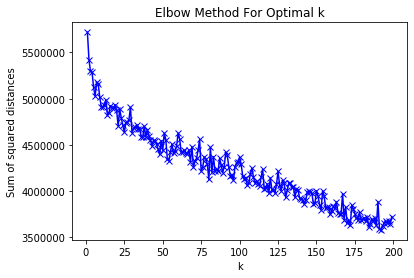

In [14]:
import matplotlib.pyplot as plt

plt.plot(K, sum_squared, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [15]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=22)
kmeans.fit_predict(scaled)

array([14,  8,  3, ...,  5,  1,  6], dtype=int32)

In [16]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=5, metric="cosine").fit(scaled)
_, closest = neighbors.kneighbors(kmeans.cluster_centers_)

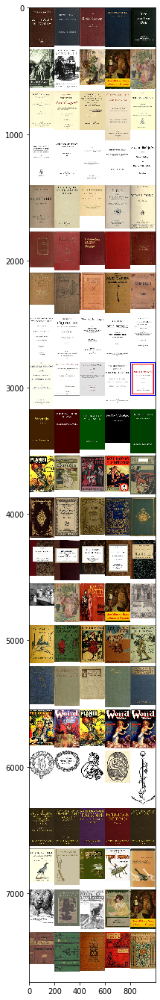

In [22]:
from PIL import Image
import matplotlib.pyplot as plt

img_width = 200

grid_image = Image.new('RGB', (5 * img_width, len(closest) * 350), (255, 255, 255, 255))

max_height = 0
for cluster_row in closest:
    max_height_temp = 0
    xpos = 0
    for col_num in cluster_row:
        img = Image.open(image_files[col_num])
        img_ar = img.width / img.height
        img = img.resize((img_width, int(img_width / img_ar)), Image.ANTIALIAS)
        max_height_temp = max(max_height_temp, img.height)
        grid_image.paste(img, (xpos, max_height))
        xpos = xpos + img.width
    max_height = max_height + max_height_temp + 20 # adding 20 pixel margin

plt.figure(figsize = (32,24))
plt.imshow(grid_image)

## 3. Image analysis (UMAP)

In [23]:
import umap.umap_ as umap

embedding = umap.UMAP().fit_transform(scaled)

In [24]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(embedding)
embedding_scaled = scaler.transform(embedding)

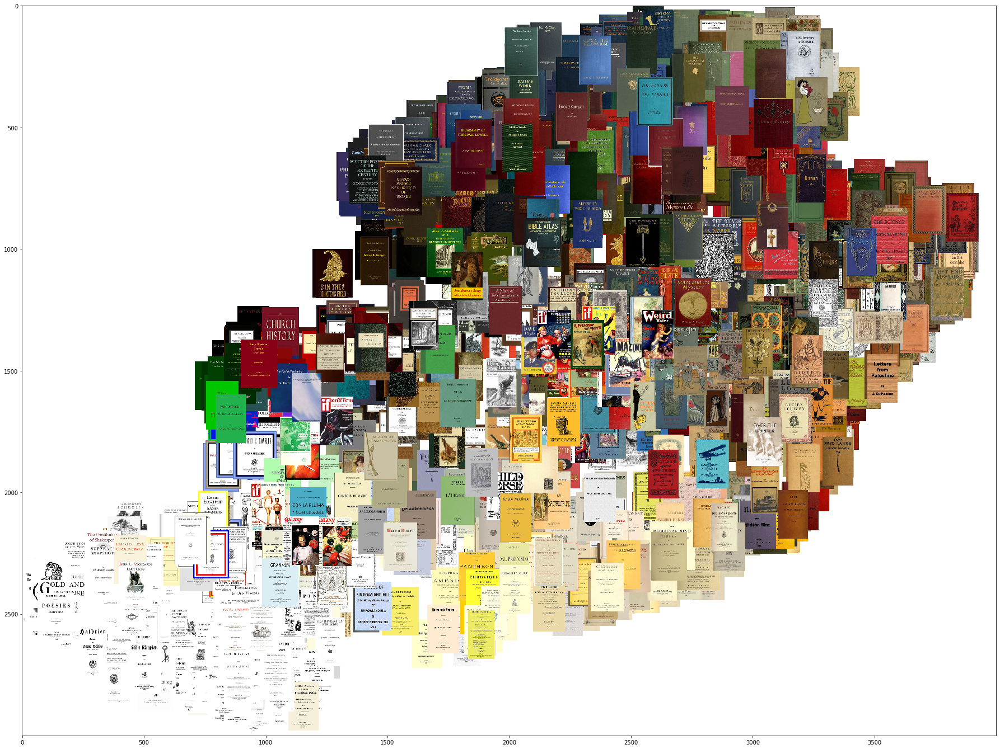

In [25]:
width = 4000
height = 3000
max_dim = 200

full_image = Image.new('RGBA', (width, height), (255, 255, 255, 255))
for img, pos in zip(image_files, embedding_scaled):
    x = pos[0]
    y = pos[1]
    tile = Image.open(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

plt.figure(figsize = (32,24))
plt.imshow(full_image)

## 4. Visual presentation experiments using Rasterfairy

In [26]:
import rasterfairy

nx = 56
ny = 25

# assign to grid
grid_assignment = rasterfairy.transformPointCloud2D(embedding, target=(nx, ny))

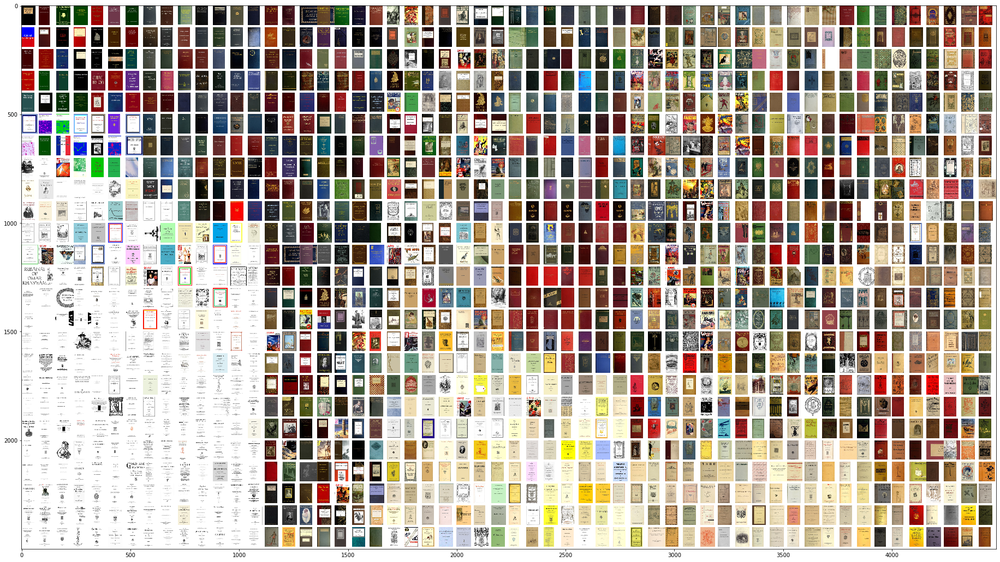

In [28]:
# Grid view without adjusting the book cover's aspect ratio

tile_width = 80
tile_height = 100

full_width = tile_width * nx 
full_height = tile_height * ny
aspect_ratio = tile_width / tile_height

grid_image = Image.new('RGB', (full_width, full_height), (255, 255, 255, 255))

for img, grid_pos in zip(image_files, grid_assignment[0]):
    idx_x, idx_y = grid_pos
    x, y = tile_width * idx_x, tile_height * idx_y
    tile = Image.open(img)
    tile_ar = tile.width / tile.height
    
    img_height_scaled = int(0.9 * tile_height)
    img_width_scaled = int(img_height_scaled * tile_ar)
    
    
    tile = tile.resize((img_width_scaled, img_height_scaled), Image.ANTIALIAS)
    grid_image.paste(tile, (int(x), int(y)))

plt.figure(figsize = (32,24))
plt.imshow(grid_image)

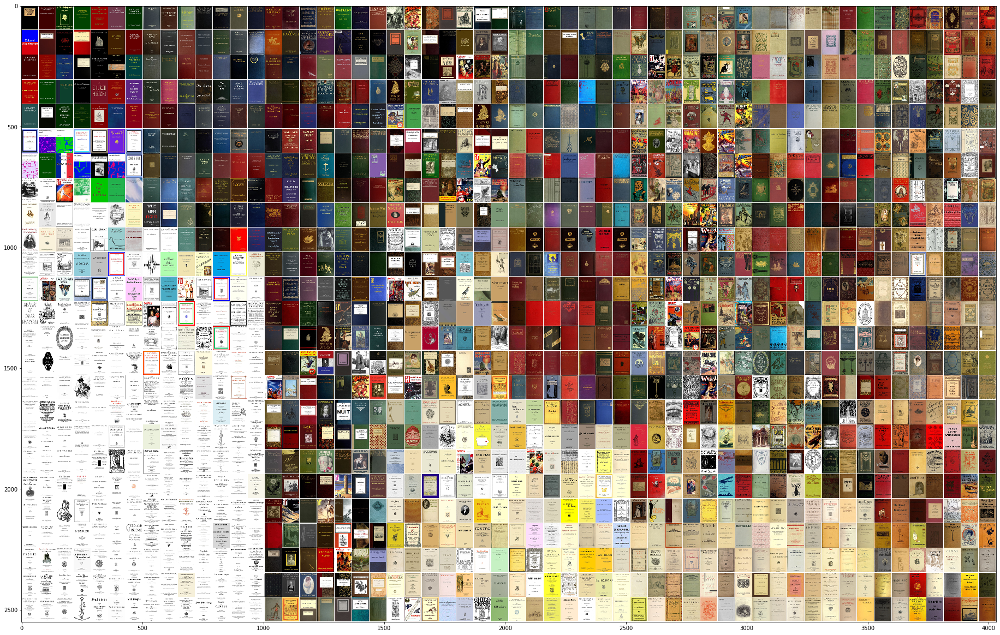

In [29]:
# Grid with adjusted aspect ratios

tile_width = 72
tile_height = 102

full_width = tile_width * nx 
full_height = tile_height * ny
aspect_ratio = tile_width / tile_height

grid_image = Image.new('RGB', (full_width, full_height), (255, 255, 255, 255))

for img, grid_pos in zip(image_files, grid_assignment[0]):
    idx_x, idx_y = grid_pos
    x, y = tile_width * idx_x, tile_height * idx_y
    tile = Image.open(img)
    tile_ar = tile.width / tile.height
    
    img_height_scaled = 100
    img_width_scaled = 70
    
    
    tile = tile.resize((img_width_scaled, img_height_scaled), Image.ANTIALIAS)
    grid_image.paste(tile, (int(x), int(y)))

plt.figure(figsize = (32,24))
plt.imshow(grid_image)

## 5. Incorporating metadata

In [197]:
# Show the additional information that we have collected in our dataframe

gutenberg_df

,uid,original_publication_year,ebook_release_year,language,n_downloads_30d,subject,cover_src
0,10570,1869,2004,en,4,"Humorous stories, English",https://www.gutenberg.org/cache/epub/10570/pg1...
1,10790,1869,2004,en,4,"Humorous stories, English",https://www.gutenberg.org/cache/epub/10790/pg1...
2,11190,1863,2004,en,5,"Humorous stories, English",https://www.gutenberg.org/cache/epub/11190/pg1...
3,11480,1863,2004,en,10,"Humorous stories, English",https://www.gutenberg.org/cache/epub/11480/pg1...
4,12130,1863,2004,en,5,"Humorous stories, English",https://www.gutenberg.org/cache/epub/12130/pg1...
...,...,...,...,...,...,...,...
1491,60500,1843,2019,de,236,Austrian fiction,https://www.gutenberg.org/cache/epub/60500/pg6...
1492,60510,1842,2019,es,191,Etiquette -- Spain -- 19th century,https://www.gutenberg.org/cache/epub/60510/pg6...
1493,60530,1885,2019,en,652,"World War, 1914-1918 -- Fiction",https://www.gutenberg.org/cache/epub/60530/pg6...
1494,60540,1870,2019,en,658,Football -- Juvenile fiction,https://www.gutenberg.org/cache/epub/60540/pg6...


In [4]:
# Hacky!: get a list of the image sources that are associated
# with english language metadata in the dataframe
# (Still figuring out the right ways to navigate a dataframe
# ...I'm sure there are better ways than this.)

en_srcs = []

for i in range(0,1400):
    if gutenberg_df.iloc[i]['language'] == 'en':
        img_src = gutenberg_df.iloc[i]['cover_src']
        img_src_short = img_src.split('/')[-1]
        en_srcs.append("./end2end_images/" + img_src_short)

print(en_srcs)

['./end2end_images/pg10570.cover.medium.jpg', './end2end_images/pg10790.cover.medium.jpg', './end2end_images/pg11190.cover.medium.jpg', './end2end_images/pg11480.cover.medium.jpg', './end2end_images/pg12130.cover.medium.jpg', './end2end_images/pg12210.cover.medium.jpg', './end2end_images/pg12630.cover.medium.jpg', './end2end_images/pg13260.cover.medium.jpg', './end2end_images/pg13510.cover.medium.jpg', './end2end_images/pg13560.cover.medium.jpg', './end2end_images/pg13760.cover.medium.jpg', './end2end_images/pg13890.cover.medium.jpg', './end2end_images/pg14110.cover.medium.jpg', './end2end_images/pg14500.cover.medium.jpg', './end2end_images/pg14550.cover.medium.jpg', './end2end_images/pg14730.cover.medium.jpg', './end2end_images/pg15370.cover.medium.jpg', './end2end_images/pg15560.cover.medium.jpg', './end2end_images/pg15920.cover.medium.jpg', './end2end_images/pg16250.cover.medium.jpg', './end2end_images/pg16310.cover.medium.jpg', './end2end_images/pg16390.cover.medium.jpg', './end2en

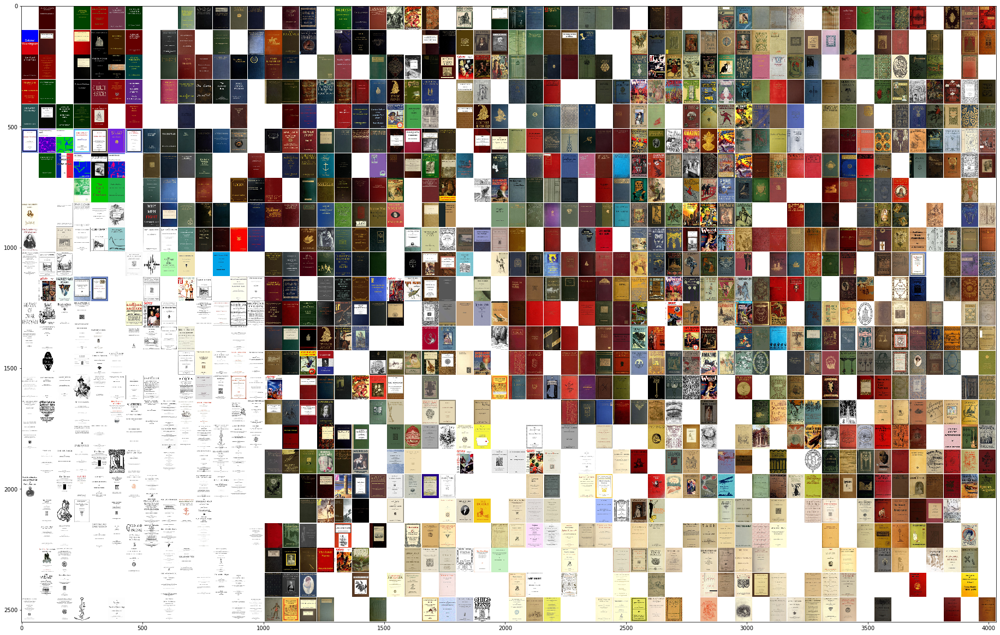

In [31]:
# Show a filtered version of the UMAP image graph,
# based on language metadata

tile_width = 72
tile_height = 102

full_width = tile_width * nx 
full_height = tile_height * ny
aspect_ratio = tile_width / tile_height

grid_image = Image.new('RGB', (full_width, full_height), (255, 255, 255, 255))

for img, grid_pos in zip(image_files, grid_assignment[0]):
    idx_x, idx_y = grid_pos
    x, y = tile_width * idx_x, tile_height * idx_y
    tile = Image.open(img)
    tile_ar = tile.width / tile.height
    
    img_height_scaled = 100
    img_width_scaled = 70
    
    tile = tile.resize((img_width_scaled, img_height_scaled), Image.ANTIALIAS)
        
    if img in en_srcs:
        grid_image.paste(tile, (int(x), int(y)))

plt.figure(figsize = (32,24))
plt.imshow(grid_image)